# Breast Cancer Histopathology Detection Using Deep-Learning

## Notebook prepared as a training example for Healthcare Image Analysis (HIMA)

### Authors: [Dr. Rahul Remanan (nanᴓveda)](remananr.com/Blog)



### Overview:

Breast cancer starts when cells in the breast begin to grow out of control. These cells usually form a tumor that can often be seen on an x-ray or felt as a lump. The tumor is malignant (cancer) if the cells can grow into (invade) surrounding tissues or spread (metastasize) to distant areas of the body. Breast cancer occurs almost entirely in women, but men can get breast cancer, too.[1](https://www.cancer.org/cancer/breast-cancer/about/what-is-breast-cancer.html)

In the United States, breast cancer is the most commonly diagnosed type of cancer and the thrid leading cause of cancer-related deaths among women.[2](https://seer.cancer.gov/statfacts/html/breast.html) In the U.S., the five-year survival rate for breast cancer is 89.7%.[3](https://seer.cancer.gov/statfacts/html/breast.html) An early diagnosis and treatment of this cancer can significantly increase the chance of survival.

For the purpose of early diagnosis, proper histophatological analysis of tissue samples is very important. During the diagnostic work-up, suspected tissue samples are evaluated for both overall and region specific tissue organization using whole-slide and microscopic images respectively. However, the large amount of data and complexity of these images make this task time consuming and non-trivial.[4](https://iciar2018-challenge.grand-challenge.org/home/) Therefore, the development of an automated breast cancer histopathology classification tool is essential for the field, to further improve the breast cancer survival rates.


### Methodology:

* Convolutional neural network using the Incpetion version 3 network
* Transfer learning using model weights trained on the Imagenet dataset
* End-to-end deep-learning architecture (from feature extraction to final classification)
* Added a stacked fully connected dense layer architecture on top of the Inception layers
* A set of custom drop-out layers to reduce overfitting

### Importing the necessary libraries:

* The model is built using tensorflow and keras

In [1]:
import sys
import argparse
import numpy as np
from PIL import Image
import requests
from io import BytesIO
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
import os
import time
import json
from keras.preprocessing import image
from keras.applications.inception_v3 import preprocess_input
from keras.models import model_from_json
from keras.optimizers import SGD, RMSprop, Adagrad
import types
from IPython.display import Image as PyImage
from IPython.core.display import HTML
import gc

Using TensorFlow backend.


### Defining variables and creating functions:

In [2]:
sgd = SGD(lr=1e-7, decay=0.5, momentum=1, nesterov=True)
rms = RMSprop(lr=1e-7, rho=0.9, epsilon=1e-08, decay=0.0)
ada = Adagrad(lr=1e-7, epsilon=1e-08, decay=0.0)
optimizer = ada

target_size = (229, 229) 

In [3]:
def generate_timestamp():
    timestring = time.strftime("%Y_%m_%d-%H_%M_%S")
    print ("Time stamp generated: "+timestring)
    return timestring

In [4]:
def is_valid_file(parser, arg):
    if not os.path.isfile(arg):
        parser.error("The file %s does not exist ..." % arg)
    else:
        return arg

In [5]:
def is_valid_dir(parser, arg):
    if not os.path.isdir(arg):
        parser.error("The folder %s does not exist ..." % arg)
    else:
        return arg

In [6]:
def compile_model(model):
    model.compile(optimizer=optimizer, 
                loss='categorical_crossentropy', metrics=['accuracy'])

In [7]:
def load_prediction_model(args):
    try:
        print (args.config_file[0]) 
        with open(args.config_file[0]) as json_file:
              model_json = json_file.read()
        model = model_from_json(model_json)
    except:
          print ("Please specify a model configuration file ...")
          sys.exit(1)
    try:
          model.load_weights(args.weights_file[0])
          print ("Loaded model weights from: " + str(args.weights_file[0]))
    except:
          print ("Error loading model weights ...")
          sys.exit(1)
    try:
        print (args.labels_file[0])
        with open(args.labels_file[0]) as json_file:
            labels = json.load(json_file)
        print ("Loaded labels from: " + str(args.labels_file[0]))
    except:
        print ("No labels loaded ...")
        sys.exit(1)
    return model, labels

In [8]:
def plot_preds(preds, labels, timestr):
  output_loc = args.output_dir[0]
  output_file_preds = os.path.join(output_loc+"//preds_out_"+timestr+".png")
  fig = plt.figure()
  plt.axis('on')
  labels = labels
  plt.barh(list(range(0, len(labels))), preds, alpha=0.5)
  plt.yticks(list(range(0, len(labels))), labels)
  plt.xlabel('Probability')
  plt.xlim(0,1.01)
  plt.tight_layout()
  fig.savefig(output_file_preds, dpi=fig.dpi)

In [9]:
def predict(model, img, target_size):
  print ("Running prediction model on the image file ...")
  if img.size != target_size:
    img = img.resize(target_size)

  _x_ = image.img_to_array(img)
  _x_ = np.expand_dims(_x_, axis=0)
  _x_ = preprocess_input(_x_)
  preds = model.predict(_x_)
  probabilities = model.predict(_x_, batch_size=1).flatten()
  prediction = labels[np.argmax(probabilities)]
  return preds[0], prediction

### Loading the data:

* Loads images, model configuration file, model weights, class labels
* Specifies the output directory to write the files

In [10]:
args=types.SimpleNamespace()
args.config_file = ['/home/rahul/ICIAR/model_22.json']
args.weights_file = ['/home/rahul/ICIAR/trained_weights_22.model']
args.labels_file = ['/home/rahul/ICIAR/trained_labels.json']
args.output_dir = ['/home/rahul/']
args.image = ['/home/rahul/ICIAR/00.jpg']
# args.image_url = ['https://goo.gl/571Pvn']

### Generating the prediction model:

* Using the model configuration and model weights, a prediction model is generated
* Four output categories: Normal, Beningn, Insitu and Invasive
* The output classification corresponds to the most common classes a pathologist needs to generate after examing a breast tissue slide

In [11]:
model, labels = load_prediction_model(args)

/home/rahul/ICIAR/model_22.json
Loaded model weights from: /home/rahul/ICIAR/trained_weights_22.model
/home/rahul/ICIAR/trained_labels.json
Loaded labels from: /home/rahul/ICIAR/trained_labels.json


### Summarizing the model:

Generating summary of the model architecture used for training.

In [12]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, None, None, 3 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, None, None, 3 96          conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, None, None, 3 0           batch_normalization_1[0][0]      
__________________________________________________________________________________________________
conv2d_2 (

activation_14 (Activation)      (None, None, None, 4 0           batch_normalization_14[0][0]     
__________________________________________________________________________________________________
activation_17 (Activation)      (None, None, None, 9 0           batch_normalization_17[0][0]     
__________________________________________________________________________________________________
average_pooling2d_2 (AveragePoo (None, None, None, 2 0           mixed0[0][0]                     
__________________________________________________________________________________________________
conv2d_13 (Conv2D)              (None, None, None, 6 16384       mixed0[0][0]                     
__________________________________________________________________________________________________
conv2d_15 (Conv2D)              (None, None, None, 6 76800       activation_14[0][0]              
__________________________________________________________________________________________________
conv2d_18 

### Testing on normal tissue:

* Using a normal histopathology microscopy image, we will test the output of the prediction model.

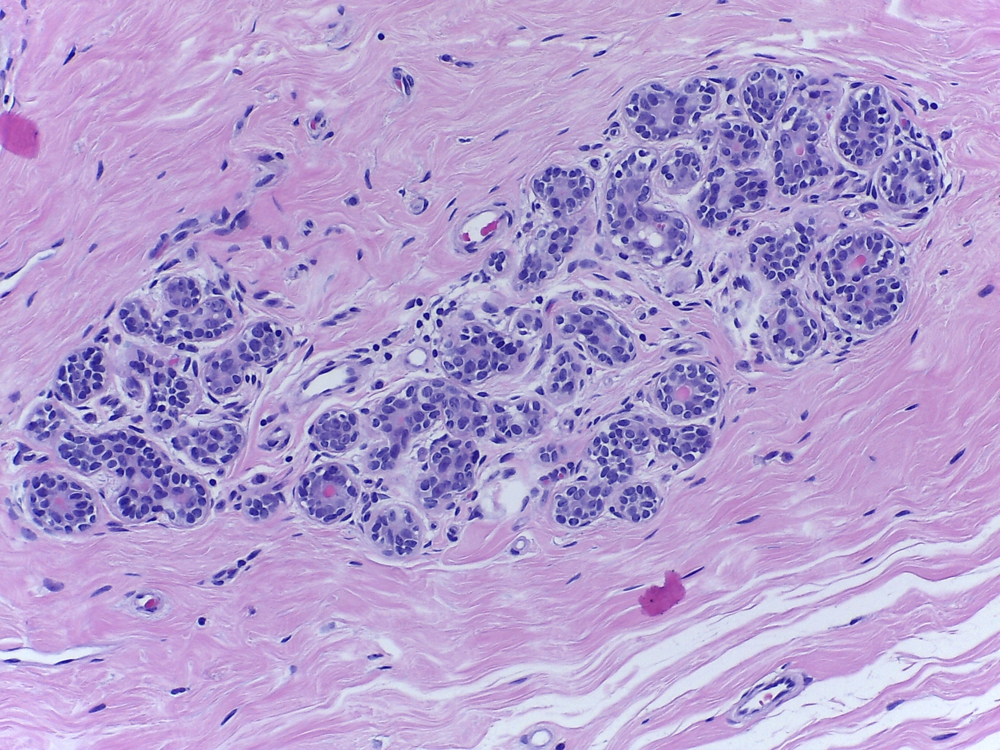

In [13]:
PyImage(args.image[0])

In [14]:
if args.image is not None:
    img = Image.open(args.image[0])
    preds = predict(model, img, target_size)
    print (preds[1] + "\t" + "\t".join(map(lambda x: "%.2f" % x, preds[0])))
    print (str(preds[1]))
    timestr = generate_timestamp()
    plot_preds(preds[0], labels, timestr)
    del (img)

Running prediction model on the image file ...
Normal	0.00	0.00	0.00	1.00
Normal
Time stamp generated: 2017_12_12-14_35_58


#### Confidence of prediction:

* The graph below shows the confidence level of the model while generating the predictions

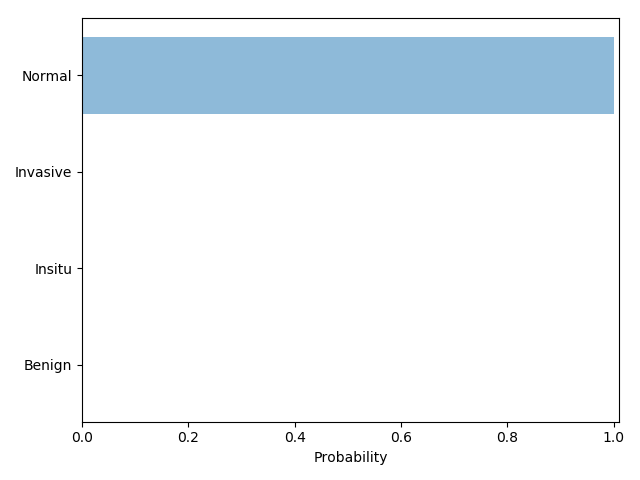

In [15]:
img_pred_plot = os.path.join('/home/rahul/preds_out_'+timestr+'.png')
PyImage(img_pred_plot)

In [16]:
del (img_pred_plot)
gc.collect

<function gc.collect>

### Testing on benign tissue:

* A benign breast tissue microscopy image is tested below

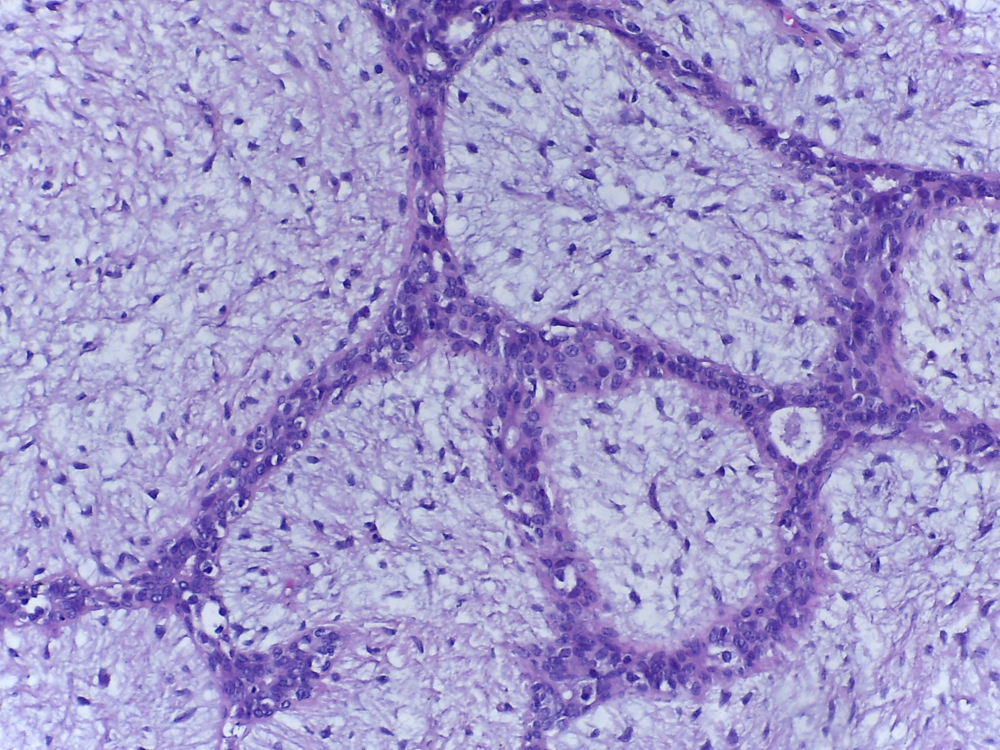

In [17]:
args.image = ['/home/rahul/ICIAR/09.jpg']
PyImage(args.image[0])

In [18]:
if args.image is not None:
    img = Image.open(args.image[0])
    preds = predict(model, img, target_size)
    print (preds[1] + "\t" + "\t".join(map(lambda x: "%.2f" % x, preds[0])))
    print (str(preds[1]))
    timestr = generate_timestamp()
    plot_preds(preds[0], labels, timestr)
    del (img)

Running prediction model on the image file ...
Benign	1.00	0.00	0.00	0.00
Benign
Time stamp generated: 2017_12_12-14_36_05


#### Confidence of prediction:

* The graph below shows the confidence level of the model while generating the predictions

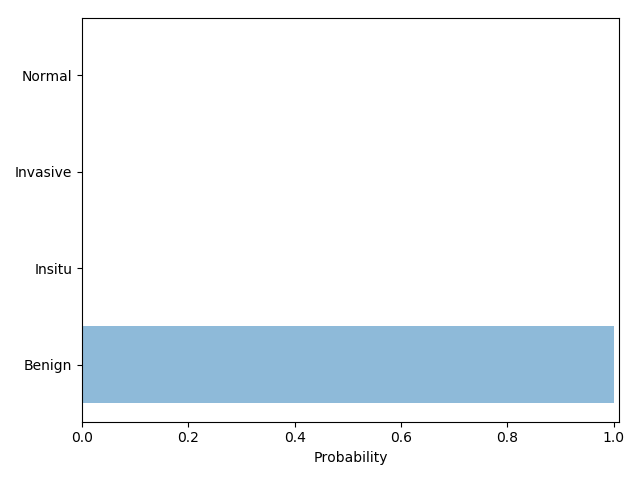

In [19]:
img_pred_plot = os.path.join('/home/rahul/preds_out_'+timestr+'.png')
PyImage(img_pred_plot)

In [20]:
del (img_pred_plot)
gc.collect

<function gc.collect>

### Testing on in-situ carcinoma:

* Breast tissue microscopy image with histopathology features of in-situ carcinoma will be tested next

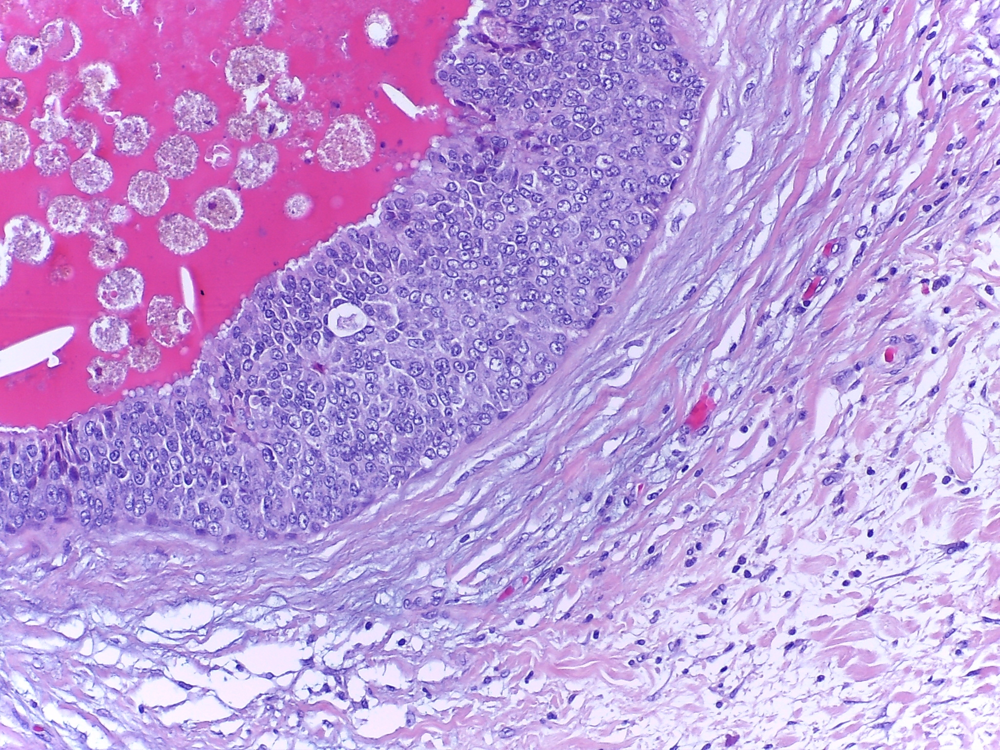

In [21]:
args.image = ['/home/rahul/ICIAR/10.jpg']
PyImage(args.image[0])

In [22]:
if args.image is not None:
    img = Image.open(args.image[0])
    preds = predict(model, img, target_size)
    print (preds[1] + "\t" + "\t".join(map(lambda x: "%.2f" % x, preds[0])))
    print (str(preds[1]))
    timestr = generate_timestamp()
    plot_preds(preds[0], labels, timestr)
    del (img)

Running prediction model on the image file ...
Insitu	0.03	0.97	0.00	0.00
Insitu
Time stamp generated: 2017_12_12-14_36_11


#### Confidence of prediction:

* The graph below shows the confidence level of the model while generating the predictions

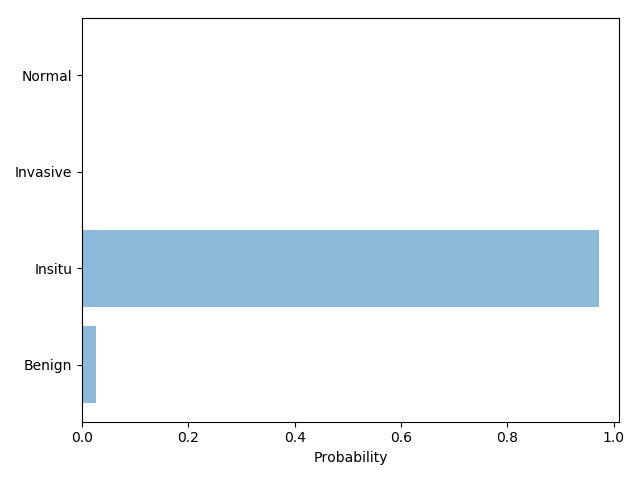

In [23]:
img_pred_plot = os.path.join('/home/rahul/preds_out_'+timestr+'.png')
PyImage(img_pred_plot)

In [24]:
del (img_pred_plot)
gc.collect

<function gc.collect>

### Testing on invasive carcinoma:

* Microscopy images of invasive breast cancer is tested next

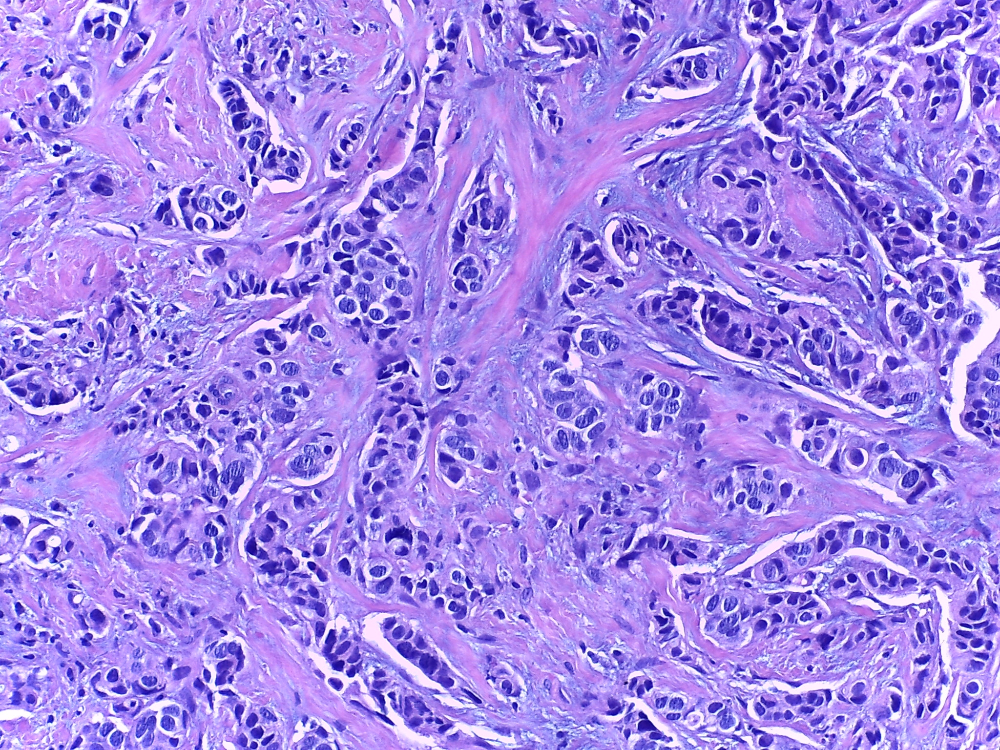

In [25]:
args.image = ['/home/rahul/ICIAR/18.jpg']
PyImage(args.image[0])

In [26]:
if args.image is not None:
    img = Image.open(args.image[0])
    preds = predict(model, img, target_size)
    print (preds[1] + "\t" + "\t".join(map(lambda x: "%.2f" % x, preds[0])))
    print (str(preds[1]))
    timestr = generate_timestamp()
    plot_preds(preds[0], labels, timestr)
    del (img)

Running prediction model on the image file ...
Invasive	0.00	0.00	1.00	0.00
Invasive
Time stamp generated: 2017_12_12-14_36_17


#### Confidence of prediction:

* The graph below shows the confidence level of the model while generating the predictions

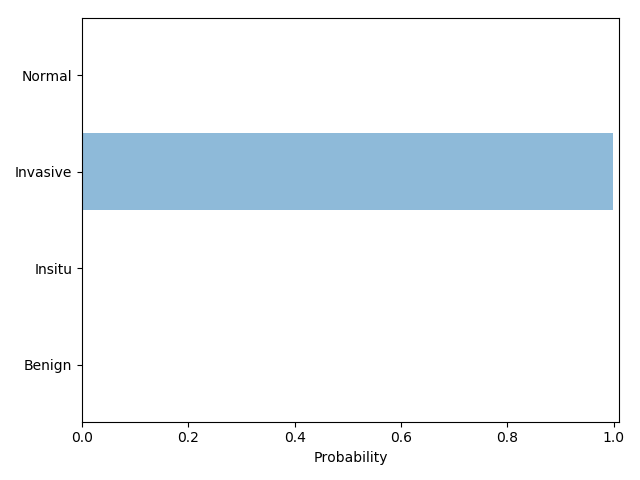

In [27]:
img_pred_plot = os.path.join('/home/rahul/preds_out_'+timestr+'.png')
PyImage(img_pred_plot)